# Doc2Vec Model Training and Vizualizations

For Reference on how to use Doc2Vec

https://github.com/RaRe-Technologies/gensim/blob/develop/docs/notebooks/doc2vec-IMDB.ipynb

In [1]:
import time
#basic imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#language imports
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
#word modeling
import gensim
from gensim.models import word2vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

from sklearn import cluster
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE

In [14]:
os.chdir('..')

In [16]:
os.chdir('Thinkful Datasets')

In [2]:
!dir

 Volume in drive C has no label.
 Volume Serial Number is 6639-23B8

 Directory of C:\Users\zdwhi\appdata\local\programs\python\python37\Thinkful Projects

04/09/2019  04:46 PM    <DIR>          .
04/09/2019  04:46 PM    <DIR>          ..
04/08/2019  06:17 PM    <DIR>          .ipynb_checkpoints
01/20/2019  07:53 PM           128,441 2017 H1B Visa data.ipynb
03/10/2019  04:44 PM         2,229,542 Boosting Drill.ipynb
01/13/2019  07:44 PM            12,872 Credit Card Fraud with multi threading.ipynb
01/29/2019  03:32 PM            63,703 Credit Card Fraud.ipynb
01/10/2019  12:24 PM       150,828,752 creditcard.csv
02/11/2019  02:15 PM    <DIR>          Mobile Money Fraud
01/20/2019  05:15 PM        57,849,891 PERM_Disclosure_Data_FY17.xlsx
01/15/2019  08:04 PM       493,534,783 PS_20174392719_1491204439457_log.csv
01/29/2019  12:25 PM    <DIR>          PS_20190128135728_373338682
01/29/2019  12:25 PM    <DIR>          PS_20190128135754_373365443
01/28/2019  02:37 PM       303,614,611 P

In [22]:
import gensim
import seaborn as sns
import os
import pandas as pd
import collections
import smart_open
import random
from sklearn.model_selection import train_test_split

from gensim.models.doc2vec import Doc2Vec, TaggedDocument

In [21]:
df = pd.read_csv('reddit_comments_cleaned.csv')

In [32]:
df = df[df['comments'].isnull()== False]

In [41]:
#Split the df for training and testing
train, test = train_test_split(df.reset_index(drop=True), test_size=.30, random_state=43)

#from nltk.tokenize import word_tokenize
tagged_tr = [TaggedDocument(words=word_tokenize(_d.lower()),\
tags=[str(i)]) for i, _d in enumerate(train['comments'])]

In [244]:
def read_corpus(text, tokens_only=False):
  for i, line in enumerate(text):
    if tokens_only:
      yield gensim.utils.simple_preprocess(line)
    else:
      # For training data, add tags
      yield gensim.models.doc2vec.TaggedDocument(gensim.utils.simple_preprocess(line), [i])

In [245]:
## Tag the Training and Test data.
train = train.reset_index(drop=True)

test = test.reset_index(drop=True)

tagged_tr = list(read_corpus(train['comments']))

tagged_test = list(read_corpus(test['comments']))

In [42]:
model = Doc2Vec(vector_size=100, # 100 should be fine based on the standards
                window=5, #change to 8
                alpha=.025, #initial learning rate
                min_alpha=0.00025, #learning rate drops linearly to this
                min_count=2, #ignores all words with total frequency lower than this.
                dm =1, #algorith 1=distributed memory
                workers=6)#cores to use

#build the vocab on the training data
model.build_vocab(tagged_tr)

iteration 1


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


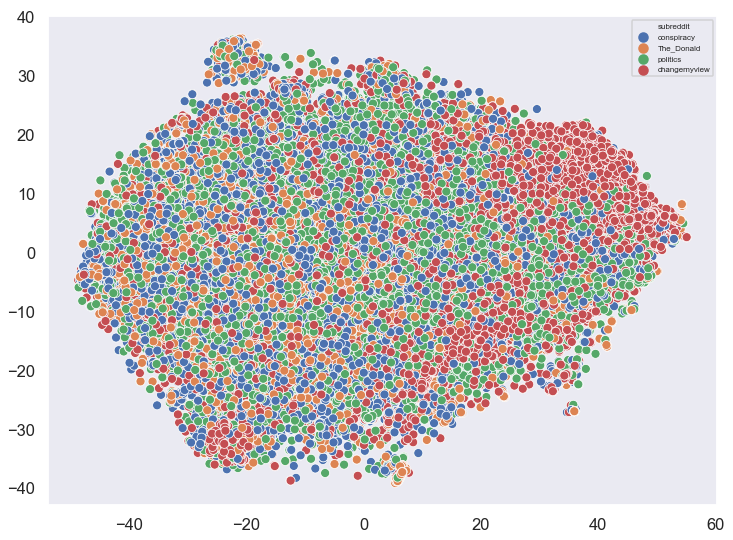

iteration 2


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 3
iteration 4
iteration 5
iteration 6


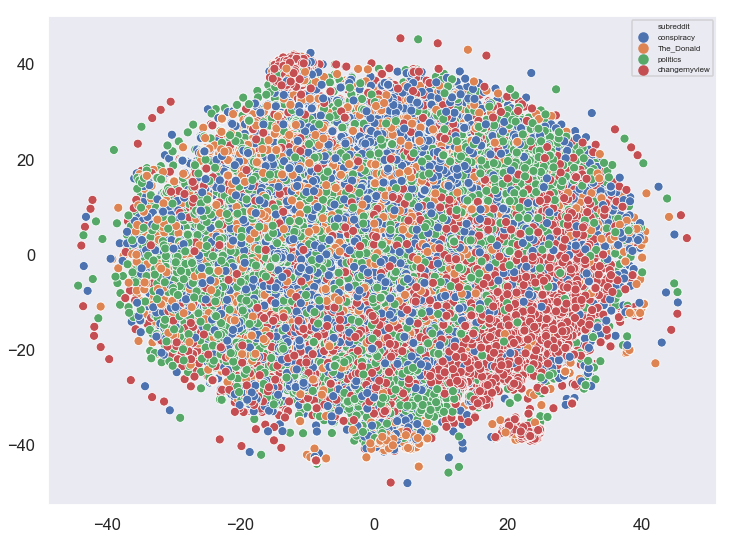

iteration 7


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 8
iteration 9
iteration 10
iteration 11


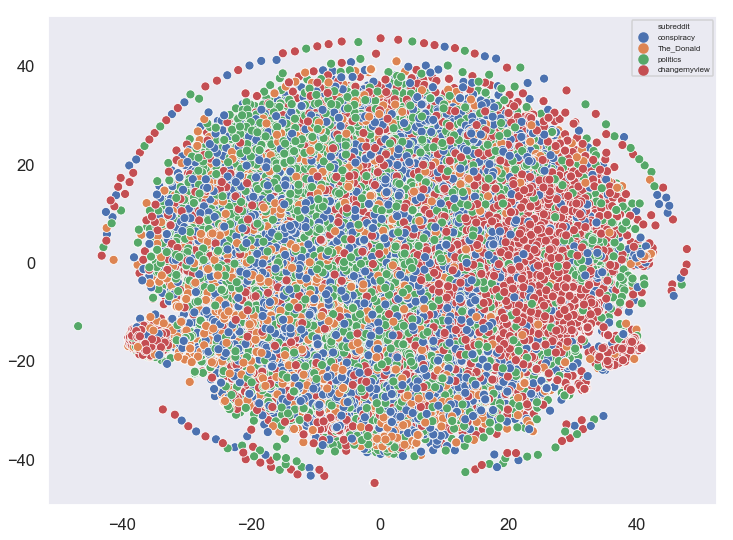

iteration 12


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 13
iteration 14
iteration 15
iteration 16


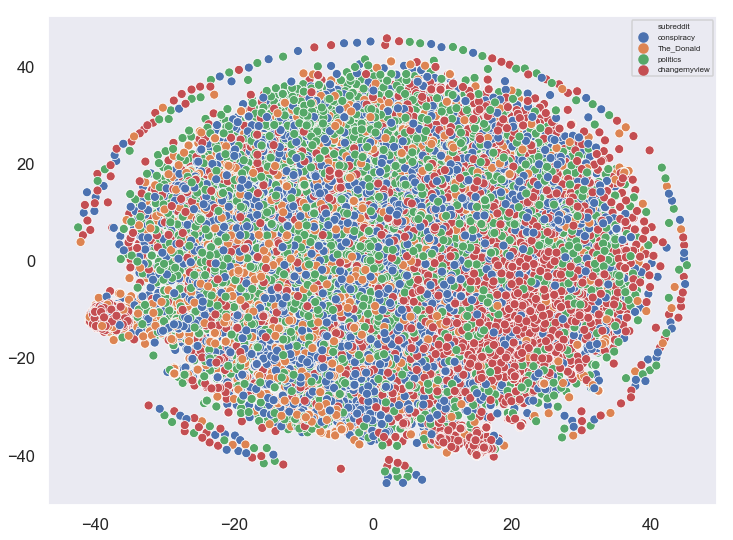

iteration 17


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 18
iteration 19
iteration 20
done!
Time: 6377.874522447586


In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import time
sns.set(style='dark', context='talk')
#Train the model
tsne = TSNE(2, random_state=43)
#max training epochs
max_epochs = 20
sil_scores = []
#train n epochs and save the model
t1 = time.time()
for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch+1))
    model.train(tagged_tr,
                total_examples=model.corpus_count,
                epochs=model.iter)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha
    #print every 5 epochs
    if epoch%5 == 0:
        vecs = pd.DataFrame([model.docvecs[str(i)] for i in range(len(tagged_tr))])
        tsne_df = tsne.fit_transform(vecs)
        plt.figure(figsize=(12,9))
        sns.scatterplot(x=tsne_df[:,0],y=tsne_df[:,1],hue=train['subreddit'], legend='full')
        plt.legend(prop={'size': 8},bbox_to_anchor=[1,1])
        plt.show()

print("done!")
t2 = time.time()    
model.save("redd2vec.model")
#print("Model Saved")
print("Time: {}".format(t2-t1))

In [54]:
#20 epochs isn't enough for this

sil_scores

[]

iteration 1


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


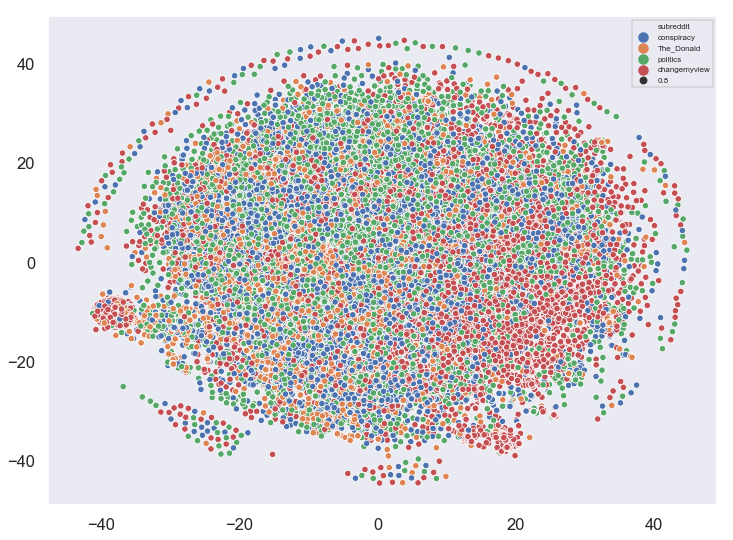

iteration 2


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11


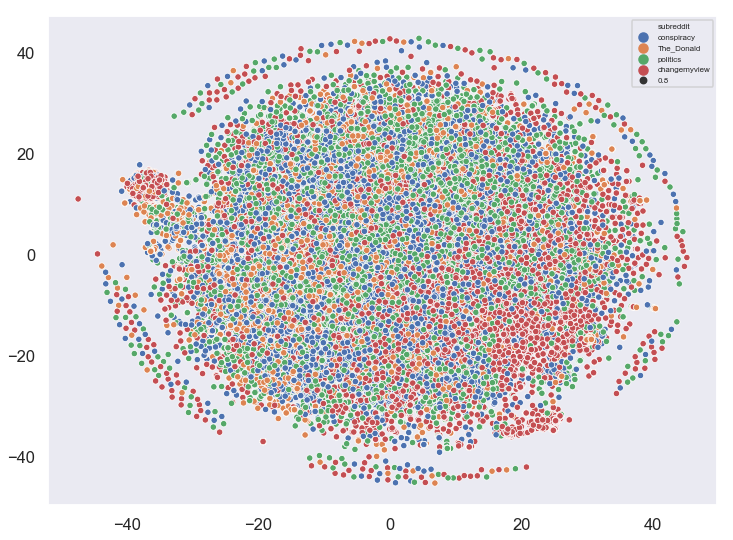

iteration 12


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21


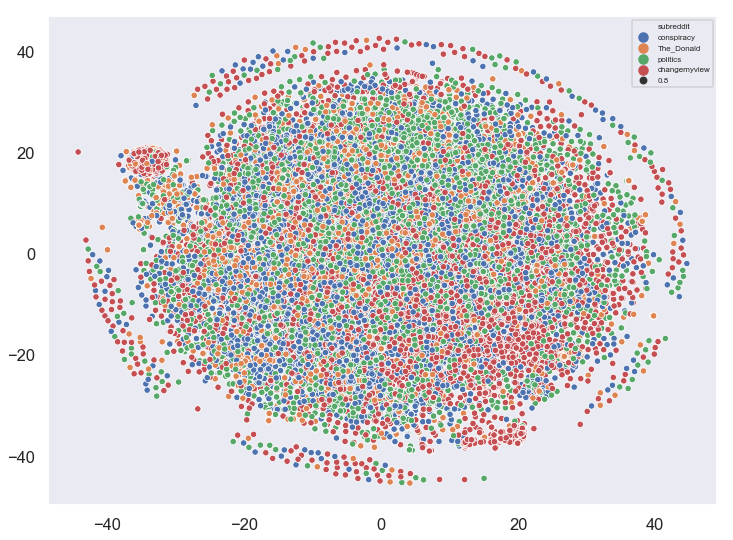

iteration 22


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31


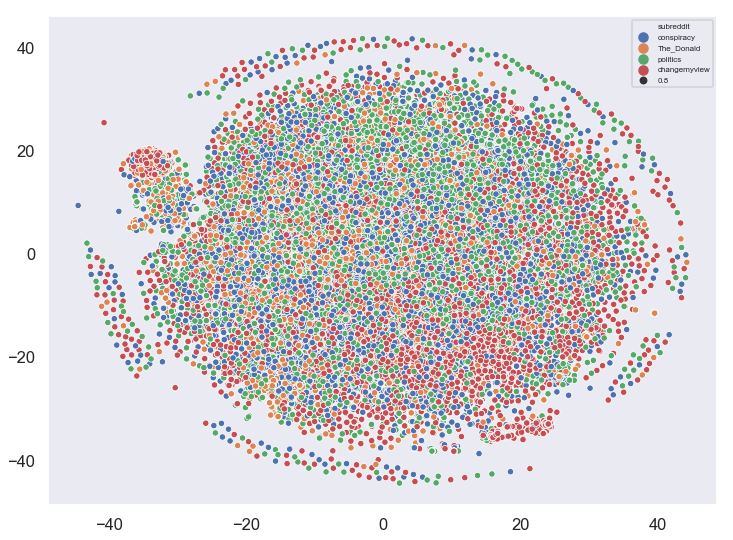

iteration 32


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41


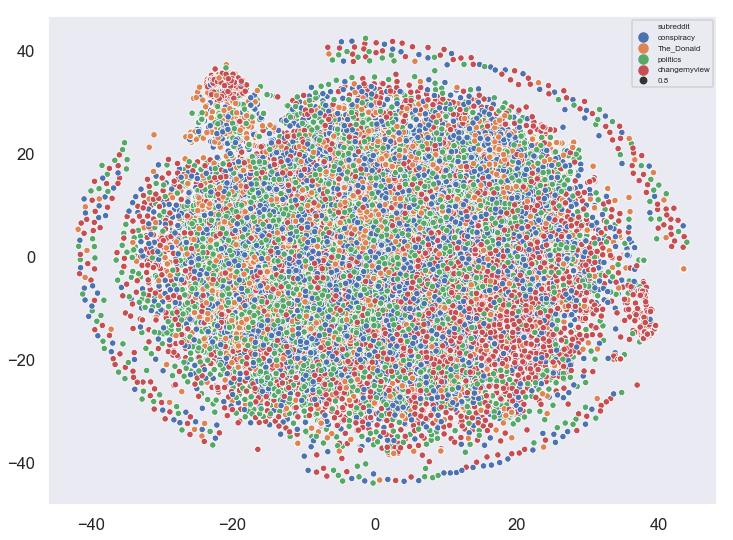

iteration 42


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51


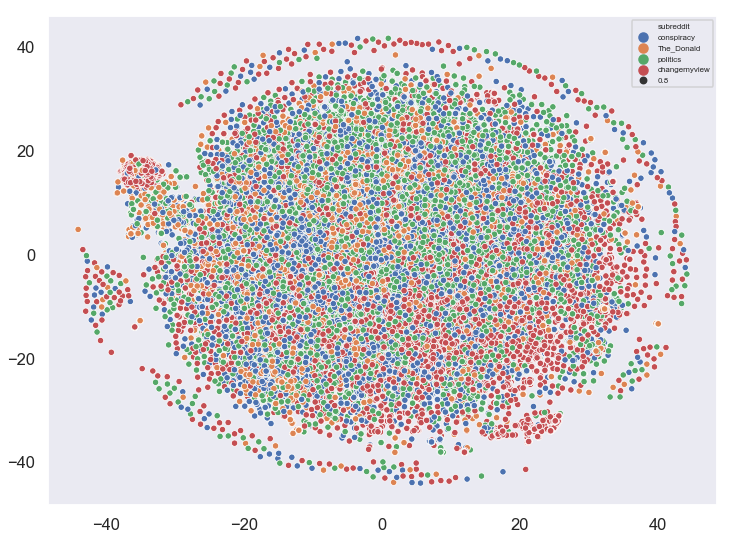

iteration 52


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61


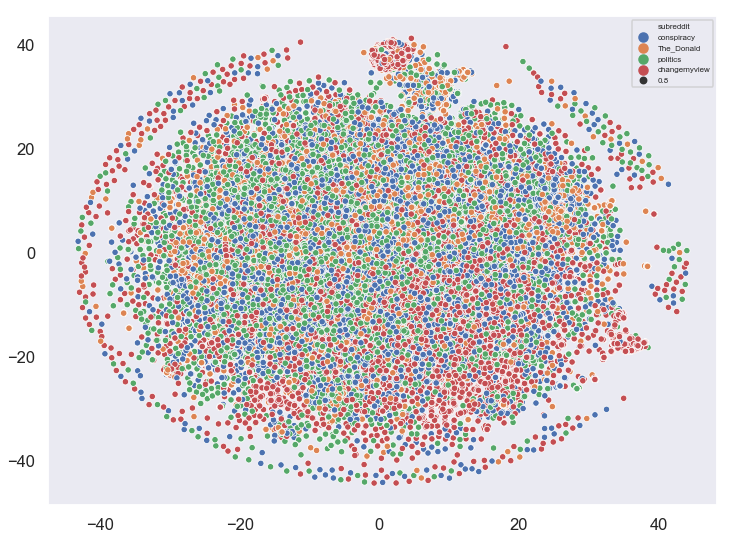

iteration 62


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71


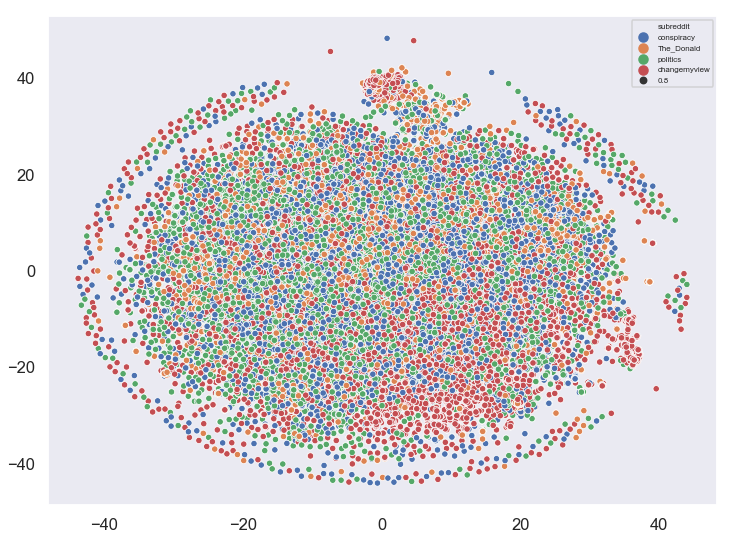

iteration 72


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 73
iteration 74
iteration 75
iteration 76
iteration 77
iteration 78
iteration 79
iteration 80
iteration 81


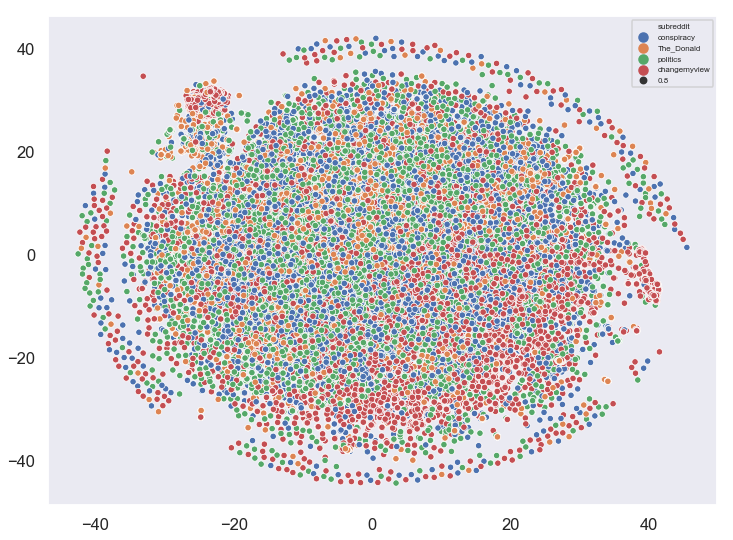

iteration 82


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 83
iteration 84
iteration 85
iteration 86
iteration 87
iteration 88
iteration 89
iteration 90
iteration 91


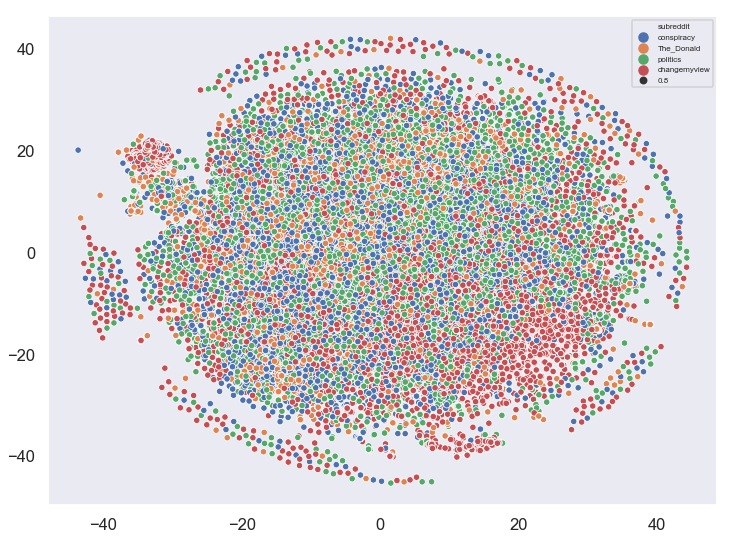

iteration 92


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 93
iteration 94
iteration 95
iteration 96
iteration 97
iteration 98
iteration 99
iteration 100
done!
Time: 16800.752059936523


In [55]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import time
sns.set(style='dark', context='talk')
#Train the model
tsne = TSNE(2, random_state=43)
#max training epochs
max_epochs = 200
sil_scores = []
#train n epochs and save the model
t1 = time.time()
for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch+1))
    model.train(tagged_tr,
                total_examples=model.corpus_count,
                epochs=model.iter)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha
    #print every 10 epochs
    
    #### You don't need to generate this in the future
    if epoch%10 == 0:
        vecs = pd.DataFrame([model.docvecs[str(i)] for i in range(len(tagged_tr))])
        tsne_df = tsne.fit_transform(vecs)
        plt.figure(figsize=(12,9))
        sns.scatterplot(x=tsne_df[:,0],y=tsne_df[:,1],hue=train['subreddit'],legend='full')
        plt.legend(prop={'size': 8},bbox_to_anchor=[1,1])
        plt.show()

print("done!")
t2 = time.time()    
model.save("redd2vec.model")
#print("Model Saved")
print("Time: {}".format(t2-t1))

In [57]:
model.alpha

0.001000000000000042

## How bad is out model?

In [58]:
### Grab the paragraph vectors from our model
X_train = np.array([model.docvecs[str(i)] for i in range(len(tagged_tr))])
y_train = train['subreddit']

In [59]:
X_test = np.array([model.infer_vector(tagged_test[i][0]) for i in range(len(tagged_test))])
y_test = test['subreddit']

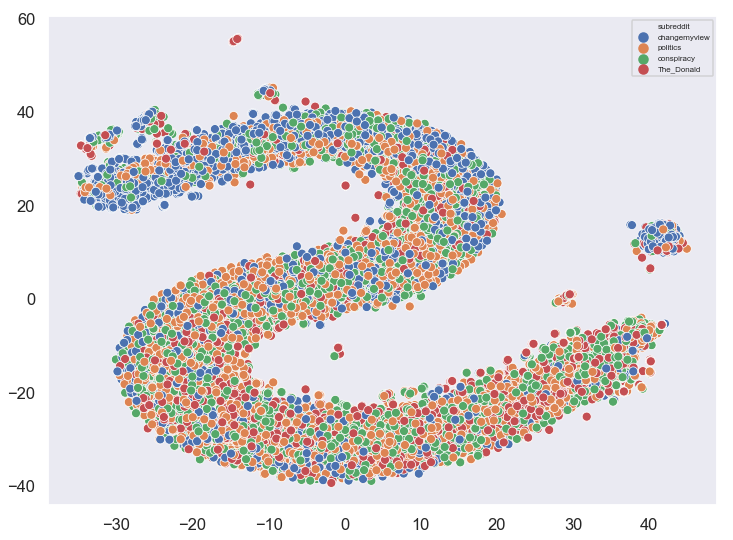

In [60]:
## Plot the vectors in 2d space
tsne_df = tsne.fit_transform(X_test)
plt.figure(figsize=(12,9))
sns.scatterplot(x=tsne_df[:,0],y=tsne_df[:,1],hue=y_test,legend='full')
plt.legend(prop={'size': 8},bbox_to_anchor=[1,1])
plt.show()



What in the world could possibly be happening here? Let's plot this in 3d and see if more structure takes place.

### 3dimensional plot

In [225]:
tsne = TSNE(n_components=3, init='pca', random_state=0)
tsne_df = tsne.fit_transform(X_test)


In [224]:
### Import plotly
import plotly
import plotly.plotly as py
plotly.tools.set_credentials_file(username='zdwhitepdx', api_key='neoqWErE3yKbGlBBEFW7')
import plotly.graph_objs as go
from plotly.offline import iplot
from IPython.display import IFrame


def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)
    

def plotly_3d(vecs,comments):
    d  = {'x': vecs[:, 0], 'y': vecs[:, 1],'z': vecs[:, 2], 'text':comments['comments'][:],'subreddit':comments['subreddit'][:]}
    df = pd.DataFrame(data=d)

    # Create a trace
    trace_dict = {}
    for i,label in enumerate(comments['subreddit'].unique()):
        trace_dict[i] = go.Scatter3d(
            x = df[df['subreddit']==label]['x'],
            y = df[df['subreddit']==label]['y'],
            z = df[df['subreddit']==label]['z'],
            text = df[df['subreddit']==label]['text'],
            mode='markers',
            marker=dict(
                size=3,
                line=dict(
                    color='rgba('+ str(i*40) + ',' + str(i*40) + ',' + str(i*40) + ', 0.14)',
                    width=0.5
                ),
                opacity=0.8
            ),
            name = label
        )
    data = [item for item in trace_dict.values()]
    layout = go.Layout(
        margin=dict(
            l=0,
            r=0,
            b=0,
            t=0
        )
    )
    #enable_plotly_in_cell()
    py.iplot(data,filename = 'reddit_comments_Test_TSNE_Doc2Vec_tags')


In [226]:
plotly_3d(tsne_df,test)

c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



In [91]:
test['comments'].reset_index(drop=True)

0        why should anybody other than people who have ...
1              late night talk show hostswelcome to earth.
2        would it be hard to just vote no on a bill tha...
3        they should not just lose their salaries they ...
4                         say goodbye to those crazy tits.
5        i watch it to learn sometimes. sometimes it is...
6               k upvotes holy shit this sub has no brakes
7                                       r unexpectedoffice
8        the gist of my argument is this religion is a ...
9                                                  removed
10       cnn trump beheads local news reporterfox news ...
11       taking out the trash day is not just a west wi...
12       same. dons not perfect but he is who we have. ...
13       i disagree....i certainly called out number of...
14       too bad you need actual skills to move to cana...
15       confirmed delta awarded to u theredmokah r cha...
16       also there is no attorney client privileged if.

In [212]:
plotly_3d(tsne_df,test)

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~zdwhitepdx/0 or inside your plot.ly account where it is named 'reddit_comments'


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



In [ ]:
plotly_3d(tsne_df,test)

### Re-run Doc2Vec model with tags

https://stackoverflow.com/questions/43543762/does-doc2vec-learn-representations-for-the-tags

https://rare-technologies.com/doc2vec-tutorial/



In [250]:

# this function needs to add the correct subreddit as tags for the doc2vec to learn from

# [i] 
def read_corpus_tag_sub(df,corp='comments',tags='subreddit',tokens_only=False):
    df=df.reset_index(drop=True)
    for i, line in enumerate(df[corp]):
        if tokens_only:
            yield gensim.utils.simple_preprocess(line)
        else:
    
    # For training data, add tags
            yield gensim.models.doc2vec.TaggedDocument(gensim.utils.simple_preprocess(line), df.at[i,tags])


In [246]:
#Split the df for training and testing
train, test = train_test_split(df.reset_index(drop=True), test_size=.30, random_state=43)

[TaggedDocument(words=['policy', 'which', 'he', 'supported', 'by', 'the', 'devil', 'herself', 'apparently', 'but', 'bernie', 'is', 'different', 'hope', 'and', 'change'], tags=[0]),
 TaggedDocument(words=['my', 'generation', 'thinks', 'he', 'is', 'so', 'great', 'yet', 'are', 'still', 'complaining', 'about', 'having', 'no', 'jobs', 'lol', 'maybe', 'you', 'should', 'blame', 'him'], tags=[1]),
 TaggedDocument(words=['brainless', 'cucks', 'on', 'twitter', 'are', 'unironically', 'saying', 'that', 'right', 'now'], tags=[2]),
 TaggedDocument(words=['it', 'was', 'not', 'potatoes', 'it', 'was', 'pizza', 'because', 'of', 'the', 'tomato', 'sauce', 'it', 'lifted', 'restrictions', 'on', 'the', 'number', 'of', 'servings', 'of', 'potatoes', 'but', 'they', 'were', 'already', 'classified', 'as', 'vegetables'], tags=[3]),
 TaggedDocument(words=['ymmv', 'obviously', 'but', 'never', 'had', 'this', 'problem', 'of', 'only', 'the', 'teachers', 'answers', 'are', 'right', 'think', 'what', 'happens', 'is', 'lot'

In [252]:
tagged_tr = list(read_corpus_tag_sub(train))

tagged_test = list(read_corpus_tag_sub(test))

In [253]:
model = Doc2Vec(vector_size=100, # 100 should be fine based on the standards
                window=3, #change to 8
                alpha=.025, #initial learning rate
                min_alpha=0.00025, #learning rate drops linearly to this
                min_count=2, #ignores all words with total frequency lower than this.
                dm =1, #algorith 1=distributed memory
                workers=6)#cores to use

#build the vocab on the training data
model.build_vocab(tagged_tr)

In [255]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import time
sns.set(style='dark', context='talk')
#Train the model
tsne = TSNE(2, random_state=43)
#max training epochs
max_epochs = 100
sil_scores = []
#train n epochs and save the model
t1 = time.time()
for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch+1))
    model.train(tagged_tr,
                total_examples=model.corpus_count,
                epochs=model.iter)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha
    #print every 20 epochs
    t2=time.time()
    if epoch%20 == 0:
        print("Time: {}".format(t2-t1))
        #vecs = pd.DataFrame([model.docvecs[str(i)] for i in range(len(tagged_tr))])
        #tsne_df = tsne.fit_transform(vecs)
        #plt.figure(figsize=(12,9))
        #sns.scatterplot(x=tsne_df[:,0],y=tsne_df[:,1],hue=train['subreddit'], legend='full')
        #plt.legend(prop={'size': 8},bbox_to_anchor=[1,1])
        #plt.show()

print("done!")
t_final = time.time()    
model.save("redd2vec_tag.model")
#print("Model Saved")
print("Time: {}".format(t_final-t1))

iteration 1


c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).



Time: 17.87727952003479
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
Time: 374.85697531700134
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
Time: 746.6671180725098
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
Time: 1123.7341363430023
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71


In [256]:
tagged_test

[TaggedDocument(words=['why', 'should', 'anybody', 'other', 'than', 'people', 'who', 'have', 'sex', 'with', 'children', 'do', 'any', 'of', 'the', 'above'], tags='changemyview'),
 TaggedDocument(words=['late', 'night', 'talk', 'show', 'hostswelcome', 'to', 'earth'], tags='politics'),
 TaggedDocument(words=['would', 'it', 'be', 'hard', 'to', 'just', 'vote', 'no', 'on', 'bill', 'that', 'you', 'are', 'not', 'given', 'proper', 'time', 'to', 'read'], tags='conspiracy'),
 TaggedDocument(words=['they', 'should', 'not', 'just', 'lose', 'their', 'salaries', 'they', 'should', 'be', 'confined', 'to', 'washington', 'and', 'sequestered', 'in', 'the', 'capitol', 'under', 'armed', 'lockdown', 'by', 'federal', 'marshals', 'until', 'they', 'come', 'to', 'an', 'agreementyou', 'would', 'have', 'to', 'amend', 'the', 'constitution', 'the', 'decision', 'to', 'recess', 'technically', 'adjourn', 'to', 'set', 'date', 'is', 'in', 'the', 'hands', 'of', 'congress', 'unless', 'the', 'president', 'were', 'to', 'call

In [257]:
X_test = np.array([model.infer_vector(tagged_test[i][0]) for i in range(len(tagged_test))])
y_test = test['subreddit']




array([[-0.06416052, -0.00906513, -0.00637903, ..., -0.10860605,
        -0.04572263,  0.01350146],
       [ 0.01213059, -0.00390872, -0.05629376, ..., -0.03910339,
         0.00572786,  0.04647369],
       [-0.06525197,  0.01541929, -0.03239322, ..., -0.04366483,
        -0.02554208,  0.00520874],
       ...,
       [-0.05018613,  0.03167595, -0.08814891, ..., -0.08723909,
        -0.07448085,  0.15273729],
       [-0.01073452, -0.01389635, -0.06686729, ..., -0.0337172 ,
        -0.03463191,  0.0840724 ],
       [-0.18260522, -0.18764953, -0.18062572, ..., -0.09752846,
        -0.2175202 ,  0.26388708]], dtype=float32)

In [259]:
tsne = TSNE(n_components=3, init='pca', random_state=0)
tsne_df = tsne.fit_transform(X_test)


In [260]:
plotly_3d(tsne_df,test)

c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



In [274]:
word_vec = model['cuck']

In [275]:
model.docvecs.most_similar([word_vec])

[('e', 0.3129080832004547),
 ('_', 0.22928078472614288),
 ('d', 0.1887660026550293),
 ('r', 0.1795637309551239),
 ('T', 0.1743614822626114),
 ('D', 0.16604721546173096),
 ('y', 0.13087253272533417),
 ('c', 0.06914128363132477),
 ('l', 0.03962137550115585),
 ('i', 0.03584782034158707)]

In [278]:
model.most_similar('cuck')

c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).



[('unironically', 0.4559176564216614),
 ('coworker', 0.43622738122940063),
 ('cannon', 0.42765992879867554),
 ('fag', 0.4240732789039612),
 ('shill', 0.3970140516757965),
 ('demonitized', 0.39346274733543396),
 ('projecting', 0.3926714360713959),
 ('traitor', 0.3863475024700165),
 ('sarcasm', 0.3846171200275421),
 ('barron', 0.37915971875190735)]

In [379]:
model.most_similar('winner')

c:\users\zdwhi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).



[('margins', 0.42488542199134827),
 ('deference', 0.4140974283218384),
 ('reigns', 0.4046538174152374),
 ('lmaoooo', 0.3960115611553192),
 ('upwards', 0.3894999325275421),
 ('rowan', 0.38929638266563416),
 ('wednesday', 0.38881829380989075),
 ('nothingburger', 0.38271841406822205),
 ('faxzero', 0.36879241466522217),
 ('baton', 0.3644797205924988)]

### Train a Classifier

In [406]:
tagged_tr[0]

TaggedDocument(words=['policy', 'which', 'he', 'supported', 'by', 'the', 'devil', 'herself', 'apparently', 'but', 'bernie', 'is', 'different', 'hope', 'and', 'change'], tags='conspiracy')

In [404]:
print(str(model))

Doc2Vec(dm/m,d100,n5,w3,mc2,s0.001,t6)


In [436]:
def vec_for_learning(model, tagged_docs):
    sents = tagged_docs
    targets, regressors = zip(*[(doc.tags, model.infer_vector(doc.words, steps=20)) for doc in sents])
    return targets, regressors

In [437]:
y_logit_train,X_logit_train = vec_for_learning(model, tagged_tr)

y_logit_test,X_logit_test = vec_for_learning(model, tagged_test)

In [443]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score

logreg = LogisticRegression(solver = 'newton-cg',random_state = 0, multi_class='multinomial',n_jobs=1, C=1e5)
logreg.fit(X_logit_train, y_logit_train)
y_pred = logreg.predict(X_logit_test)


In [444]:
print('Testing accuracy %s' % accuracy_score(y_test, y_pred))
print('Testing F1 score: {}'.format(f1_score(y_test, y_pred, average='weighted')))

Testing accuracy 0.5192204245458684
Testing F1 score: 0.5221118219267181


In [ ]:
from sklearn.metrics import confusion_matrix



array(['politics', 'politics', 'politics', ..., 'politics', 'politics',
       'The_Donald'], dtype='<U12')

### Make a Pretty Confusion Matrix

https://github.com/wcipriano/pretty-print-confusion-matrix/blob/master/confusion_matrix_pretty_print.py Source code for all of this

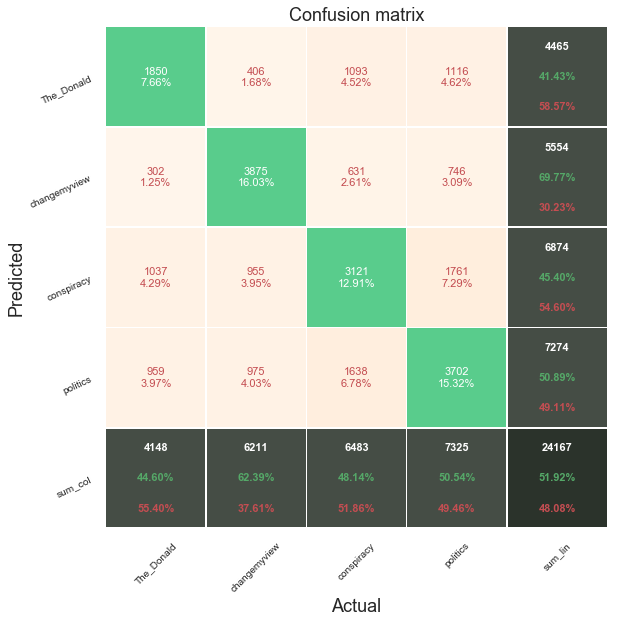

In [473]:
plot_confusion_matrix_from_data(y_test,y_pred,columns=['The_Donald', 'changemyview', 'conspiracy', 'politics'])

__main__
_test_cm: test function with confusion matrix done
and pause


C:\Users\zdwhi\appdata\local\programs\python\python37\Thinkful Datasets\confusion_matrix_pretty_print.py:64: DeprecationWarning:

In future, it will be an error for 'np.bool_' scalars to be interpreted as an index



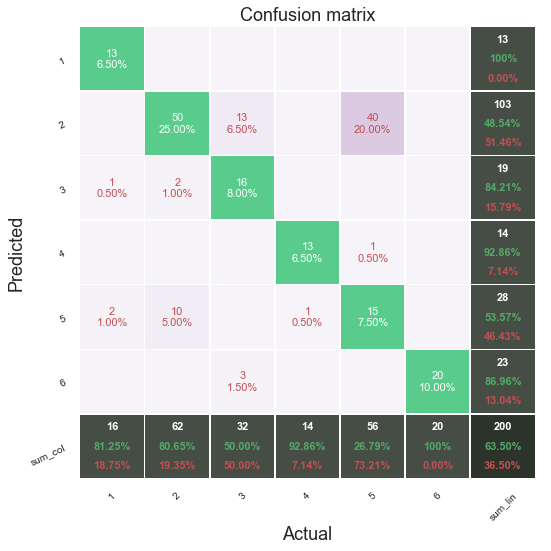

_test_data_class: test function with y_test (actual values) and predictions (predic)


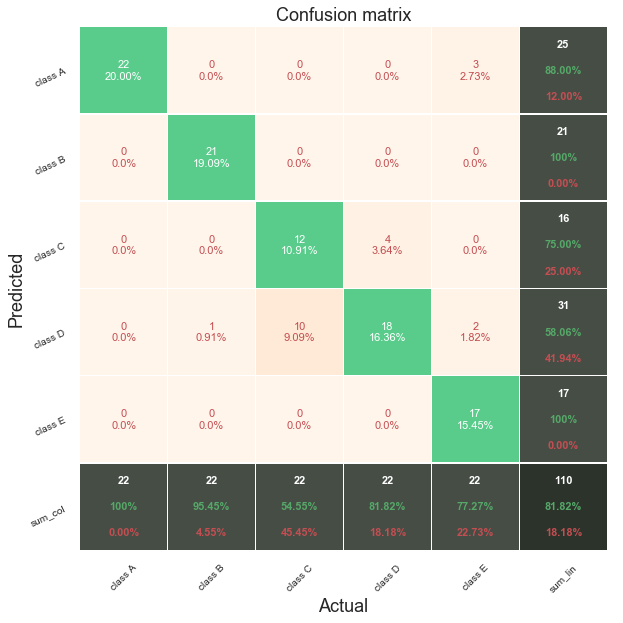

In [457]:
### This will download and load the pretty looking confusion matrix module
!curl -O https://raw.githubusercontent.com/wcipriano/pretty-print-confusion-matrix/master/confusion_matrix_pretty_print.py
%run confusion_matrix_pretty_print.py


In [475]:
np.unique(y_pred)

AttributeError: 'numpy.ndarray' object has no attribute 'values'